# PMU data analysis

## Annotation

In [1]:
with open('VUJE/PMU/Anotacia.txt', 'r', encoding='cp1250') as f:
    text = f.read()
    print(text)

Hlavička	Poznámka
Date	dátum
Time (Europe/Prague)	čas
Status	špeciálne kódovanie SEPS
Frequency	sieťová frekvencia
df/dt	zmena sieťovej frekvencie v čase
PhasorUL1 Magnitude	amplitúda hod. napätia fázy UL1
PhasorUL1 Angle	uhol fázy UL1
PhasorUL2 Magnitude	amplitúda hod. napätia fázy UL2
PhasorUL2 Angle	uhol fázy UL2
PhasorUL3 Magnitude	amplitúda hod. napätia fázy UL3
PhasorUL3 Angle	uhol fázy UL3
PhasorIL1 Magnitude	amplitúda hod. prúdu fázy IL1
PhasorIL1 Angle	uhol fázy IL1
PhasorIL2 Magnitude	amplitúda hod. prúdu fázy IL2
PhasorIL2 Angle	uhol fázy IL2
PhasorIL3 Magnitude	amplitúda hod. prúdu fázy IL3
PhasorIL3 Angle	uhol fázy IL3



In [2]:
filename = 'VUJE/PMU/SENI-V280-PMU1.txt'

In [3]:
import matplotlib.pyplot as plt
import pandas as pd
import seaborn as sns

## read data

In [4]:
df = pd.read_csv(filename, sep='\t', header=1)
df

,Date,Time (Europe/Prague),Status,Frequency,df/dt,PhasorUL1 Magnitude,PhasorUL1 Angle,PhasorUL2 Magnitude,PhasorUL2 Angle,PhasorUL3 Magnitude,PhasorUL3 Angle,PhasorIL1 Magnitude,PhasorIL1 Angle,PhasorIL2 Magnitude,PhasorIL2 Angle,PhasorIL3 Magnitude,PhasorIL3 Angle
0,14.10.2017,00:00:00.000,08 42,50.041847,-0.005150,237849.0625,89.154503,237825.0313,-30.875883,237562.0781,-150.945312,154.555328,99.274773,153.788910,-22.731987,153.628143,-142.873932
1,14.10.2017,00:00:00.020,08 42,50.041916,0.003433,237845.2969,89.454811,237818.2344,-30.575308,237552.7656,-150.643311,154.571671,99.557648,153.766144,-22.440794,153.632385,-142.587112
2,14.10.2017,00:00:00.040,08 42,50.042175,0.012970,237838.1875,89.757561,237821.2656,-30.272631,237550.8750,-150.341980,154.623581,99.848816,153.803146,-22.152246,153.645355,-142.293793
3,14.10.2017,00:00:00.060,08 42,50.042114,-0.003052,237836.9375,90.061516,237823.3281,-29.969061,237546.7656,-150.039948,154.672989,100.144821,153.917206,-21.855564,153.732971,-142.012039
4,14.10.2017,00:00:00.080,08 42,50.041885,-0.011444,237827.1719,90.365318,237817.7500,-29.666750,237541.6406,-149.737061,154.738144,100.451317,154.060028,-21.569649,153.822586,-141.727524
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1048569,14.10.2017,05:49:31.380,08 42,49.992611,0.009727,237029.3906,150.755234,237004.1406,30.711153,236658.4063,-89.372719,187.971619,163.918243,185.498627,42.589493,188.536102,-77.627571
1048570,14.10.2017,05:49:31.400,08 42,49.992943,0.016594,237040.3281,150.705200,237002.6875,30.658274,236660.7656,-89.423195,187.906128,163.895676,185.504776,42.540550,188.439789,-77.678841
1048571,14.10.2017,05:49:31.420,08 42,49.993084,0.007057,237044.6094,150.655579,237009.1563,30.607164,236652.8125,-89.473740,187.773605,163.854416,185.410110,42.502525,188.327805,-77.725578
1048572,14.10.2017,05:49:31.440,08 42,49.992680,-0.020218,237045.2500,150.604202,237004.1406,30.554718,236650.2656,-89.526367,187.705643,163.811844,185.347015,42.470245,188.257568,-77.758797


## create datetime index

In [5]:
date_col = df.columns[0]
time_col = df.columns[1]

df['datetime'] = pd.to_datetime(
    df[date_col] + ' ' + df[time_col],
    format='%d.%m.%Y %H:%M:%S.%f'
)

# Set as DatetimeIndex
df = df.set_index('datetime')
df

,Date,Time (Europe/Prague),Status,Frequency,df/dt,PhasorUL1 Magnitude,PhasorUL1 Angle,PhasorUL2 Magnitude,PhasorUL2 Angle,PhasorUL3 Magnitude,PhasorUL3 Angle,PhasorIL1 Magnitude,PhasorIL1 Angle,PhasorIL2 Magnitude,PhasorIL2 Angle,PhasorIL3 Magnitude,PhasorIL3 Angle
datetime,,,,,,,,,,,,,,,,,
2017-10-14 00:00:00.000,14.10.2017,00:00:00.000,08 42,50.041847,-0.005150,237849.0625,89.154503,237825.0313,-30.875883,237562.0781,-150.945312,154.555328,99.274773,153.788910,-22.731987,153.628143,-142.873932
2017-10-14 00:00:00.020,14.10.2017,00:00:00.020,08 42,50.041916,0.003433,237845.2969,89.454811,237818.2344,-30.575308,237552.7656,-150.643311,154.571671,99.557648,153.766144,-22.440794,153.632385,-142.587112
2017-10-14 00:00:00.040,14.10.2017,00:00:00.040,08 42,50.042175,0.012970,237838.1875,89.757561,237821.2656,-30.272631,237550.8750,-150.341980,154.623581,99.848816,153.803146,-22.152246,153.645355,-142.293793
2017-10-14 00:00:00.060,14.10.2017,00:00:00.060,08 42,50.042114,-0.003052,237836.9375,90.061516,237823.3281,-29.969061,237546.7656,-150.039948,154.672989,100.144821,153.917206,-21.855564,153.732971,-142.012039
2017-10-14 00:00:00.080,14.10.2017,00:00:00.080,08 42,50.041885,-0.011444,237827.1719,90.365318,237817.7500,-29.666750,237541.6406,-149.737061,154.738144,100.451317,154.060028,-21.569649,153.822586,-141.727524
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2017-10-14 05:49:31.380,14.10.2017,05:49:31.380,08 42,49.992611,0.009727,237029.3906,150.755234,237004.1406,30.711153,236658.4063,-89.372719,187.971619,163.918243,185.498627,42.589493,188.536102,-77.627571
2017-10-14 05:49:31.400,14.10.2017,05:49:31.400,08 42,49.992943,0.016594,237040.3281,150.705200,237002.6875,30.658274,236660.7656,-89.423195,187.906128,163.895676,185.504776,42.540550,188.439789,-77.678841
2017-10-14 05:49:31.420,14.10.2017,05:49:31.420,08 42,49.993084,0.007057,237044.6094,150.655579,237009.1563,30.607164,236652.8125,-89.473740,187.773605,163.854416,185.410110,42.502525,188.327805,-77.725578


## Status

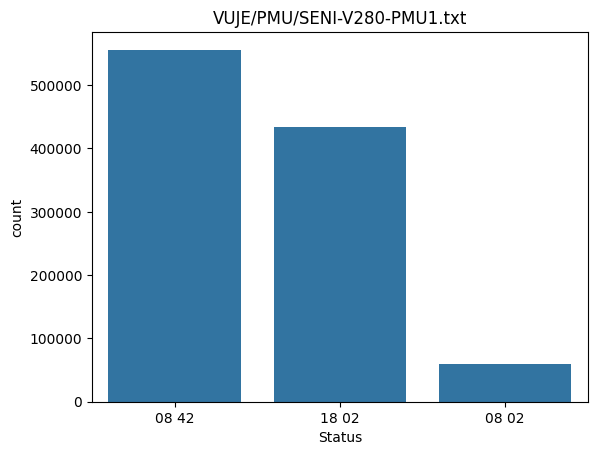

In [6]:
sns.countplot(data=df, x='Status')
plt.title(filename)
plt.show()

### data capture begin

In [7]:
df.index.min()

Timestamp('2017-10-14 00:00:00')

### data capture end

In [8]:
df.index.max()

Timestamp('2017-10-14 05:49:31.460000')

### sampling rate

In [9]:
(df.index[1:]-df.index[:-1]).unique()

TimedeltaIndex(['0 days 00:00:00.020000'], dtype='timedelta64[ns]', name='datetime', freq=None)

## reduce data for visualization

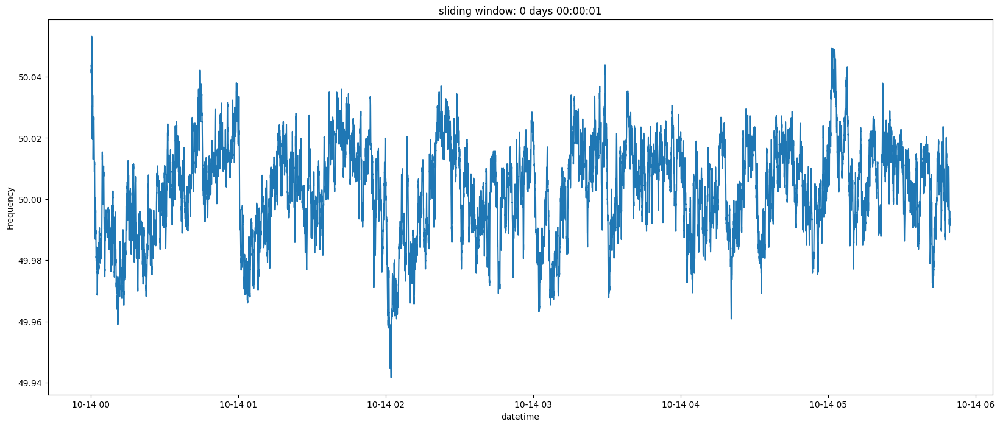

In [10]:
td = pd.Timedelta(seconds=1)

df_resampled = df.select_dtypes(include='number').resample(td).mean().reset_index()

plt.figure(figsize=(20,8))
sns.lineplot(
    data=df_resampled,
    x='datetime',
    y='Frequency'
)
plt.title(f'sliding window: {td}')
plt.show()

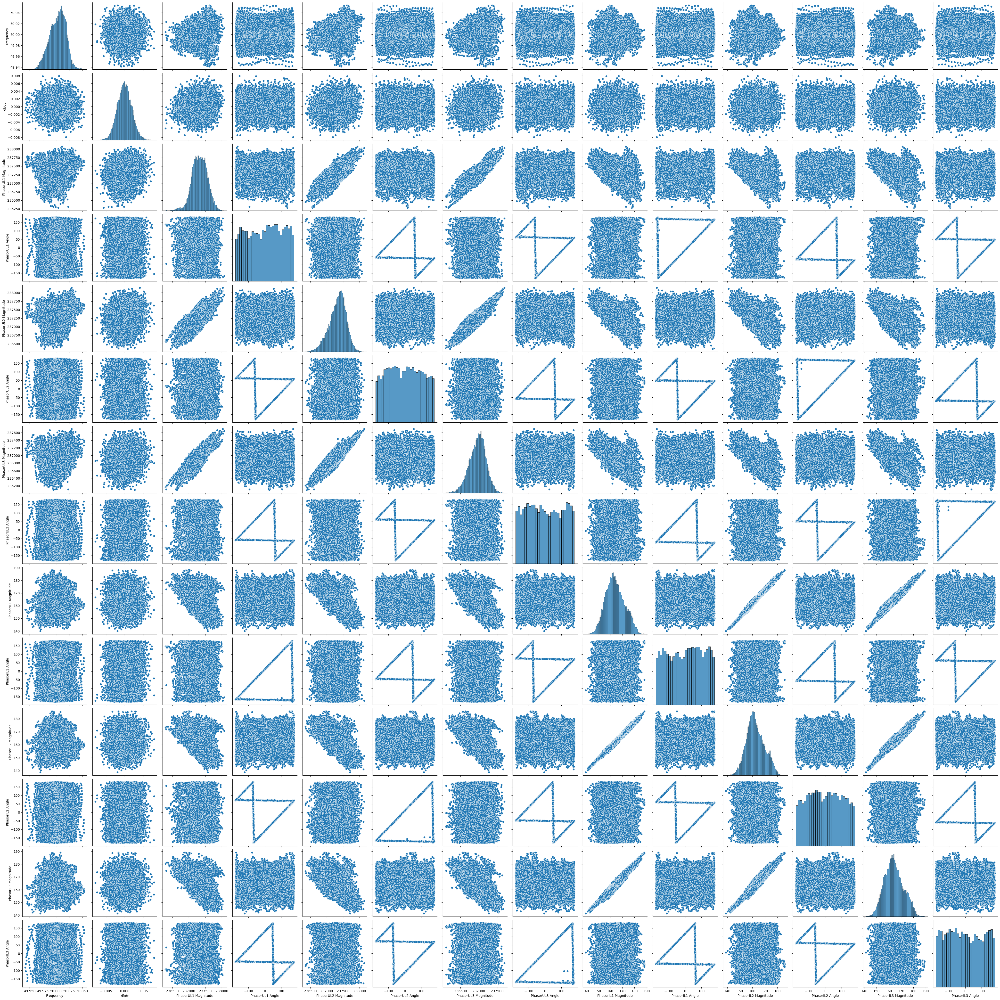

In [11]:
sns.pairplot(df_resampled, height=3, aspect=1)
plt.show()